In [1]:
import platform, sys, os
PATH = os.environ['PATH']
from pygmtsar import __version__
print(__version__)

import xarray as xr
import numpy as np
import pandas as pd
import geopandas as gpd
import json
from dask.distributed import Client
import dask
import warnings
warnings.filterwarnings('ignore')

# plotting modules
import pyvista as pv

from pygmtsar import S1, Stack, tqdm_dask, ASF, Tiles, XYZTiles, utils

# magic trick for white background
pv.set_plot_theme("document")
import panel
panel.extension(comms='ipywidgets')
panel.extension('vtk')
from contextlib import contextmanager
import matplotlib.pyplot as plt
@contextmanager
def mpl_settings(settings):
    original_settings = {k: plt.rcParams[k] for k in settings}
    plt.rcParams.update(settings)
    yield
    plt.rcParams.update(original_settings)
plt.rcParams['figure.figsize'] = [12, 4]
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.titlesize'] = 24
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12



# define Pandas display settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', 100)

#%matplotlib inline

2024.8.30.post5


In [2]:
import platform, sys, os
PATH = os.environ['PATH']
from pygmtsar import __version__
import xarray as xr
import numpy as np
import pandas as pd
import geopandas as gpd
import json
from dask.distributed import Client
import dask
import warnings
warnings.filterwarnings('ignore')
import pickle
import xarray

# plotting modules
import pyvista as pv

from pygmtsar import S1, Stack, tqdm_dask, ASF, Tiles, XYZTiles, utils

from os.path import abspath, dirname, join
PROJ_PATH = '/home/rav_marcin/projects/msg2sar'
sys.path.insert(0, PROJ_PATH)

from settings.paths import setup
setup()


from settings.paths import DATA_DIR
from utils.internal.io.json_io import open_json
from settings.paths import KEYS_DIR
from utils.internal.io.s1_stack import init_stack
from utils.internal.geo.aoi import get_aoi


main_folder = join(DATA_DIR, 'sar/sbas/desc/2023/bogo_pl_test')
WORKDIR = os.path.join(main_folder, 'raw')
DATADIR = os.path.join(main_folder, 'data')

# The subswath is required for partial scene downloads and is not used for burst downloads.
# The orbit is used to define directory names.
ORBIT    = 'D'
SUBSWATH = 3
REFERENCE = '2023-02-19'

aoi_name = 'bogo'
aois_path = join(DATA_DIR, 'polygons/aoi.geojson')

AOI_dict = get_aoi(json_path=aois_path, aoi_name=aoi_name)
AOI = gpd.GeoDataFrame.from_features([AOI_dict])

# define DEM filename inside data directory
DEM = f'{DATADIR}/dem.nc'



def pipe1_1(n_jobs=1):
    sbas = init_stack(
        dem=None,
        aoi=AOI,
        ref=REFERENCE,
        data_dir=DATADIR,
        work_dir=WORKDIR,
        verbose=True,
        drop_if_exists=False
    )

    print('Reframe')
    sbas.compute_reframe(AOI, n_jobs=n_jobs)
    
    sbas = None

def pipe1_2(n_jobs=1):
    sbas = init_stack(
        dem=DEM,
        aoi=AOI,
        ref=REFERENCE,
        data_dir=DATADIR,
        work_dir=WORKDIR,
        verbose=True,
        drop_if_exists=False
    )
    
    print('Aligment')
    sbas.compute_align(n_jobs=n_jobs)
    sbas = None
    
def pipe2(n_jobs=1):

    sbas = init_stack(
        dem=DEM,
        aoi=AOI,
        ref=REFERENCE,
        data_dir=DATADIR,
        work_dir=WORKDIR,
        verbose=True,
        drop_if_exists=False
    )
    
    print('Geocoding')
    # use the original Sentinel-1 resolution (1 pixel spacing)
    pixel_spacing = 1
    
    sbas.compute_trans(coarsen=pixel_spacing, n_jobs=n_jobs)
    sbas.compute_trans_inv(coarsen=pixel_spacing)
    
    sbas = None

def pipe3():
    sbas = init_stack(
        dem=DEM,
        aoi=AOI,
        ref=REFERENCE,
        data_dir=DATADIR,
        work_dir=WORKDIR,
        verbose=True,
        drop_if_exists=False
    )
    
    print('multilook')
    sbas.compute_satellite_look_vector()
    
    sbas = None
    

def pipe4():
    sbas = init_stack(
        dem=DEM,
        aoi=AOI,
        ref=REFERENCE,
        data_dir=DATADIR,
        work_dir=WORKDIR,
        verbose=True,
        drop_if_exists=False
    )
    
    print('compute PS')
    sbas.compute_ps()
    
    sbas = None
    

def pipe6():
    
    sbas = init_stack(
        dem=DEM,
        aoi=AOI,
        ref=REFERENCE,
        data_dir=DATADIR,
        work_dir=WORKDIR,
        verbose=True,
        drop_if_exists=False
    )
        
    baseline_pairs = sbas.sbas_pairs(days=60)
    
    sbas.compute_interferogram_multilook(baseline_pairs, 'intf_mlook', wavelength=200, psize=32, weight=sbas.psfunction(), queue=4)
    
    sbas = None
    
# Should be 7?  
def pipe7():
    
    sbas = init_stack(
        dem=DEM,
        aoi=AOI,
        ref=REFERENCE,
        data_dir=DATADIR,
        work_dir=WORKDIR,
        verbose=True,
        drop_if_exists=False
    )
        
    print('Generate Landmask')
    psmask_sbas = sbas.multilooking(sbas.psfunction(), coarsen=(1,4), wavelength=100) > 0.5
    topo_sbas = sbas.get_topo().interp_like(psmask_sbas, method='nearest')
    landmask_sbas = psmask_sbas&(np.isfinite(topo_sbas))
    landmask_sbas = utils.binary_opening(landmask_sbas, structure=np.ones((20,20)))
    landmask_sbas = np.isfinite(sbas.conncomp_main(landmask_sbas))
    landmask_sbas = utils.binary_closing(landmask_sbas, structure=np.ones((20,20)))
    landmask_sbas = np.isfinite(psmask_sbas.where(landmask_sbas))
    
    sbas = None
    return landmask_sbas
    #outdir = "/home/rav_marcin/projects/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/pickle"
    #outpath = os.path.join(outdir, 'landmask_sbas.pkl')
    #with open(outpath, 'wb') as f:  # open a text file
    #    pickle.dump(landmask_sbas, f) # serialize the list
    
    
def pipe8(landmask_sbas):
    sbas = init_stack(
        dem=DEM,
        aoi=AOI,
        ref=REFERENCE,
        data_dir=DATADIR,
        work_dir=WORKDIR,
        verbose=True,
        drop_if_exists=False
    )
        

    ds_sbas = sbas.open_stack('intf_mlook')
    
    # apply land mask
    ds_sbas = ds_sbas.where(landmask_sbas)
    
    intf_sbas = ds_sbas.phase
    corr_sbas = ds_sbas.correlation


In [3]:
print(1)

1


In [4]:
def start_client(n_workers=1, memory_limit="3.8GiB"):
    if 'dask_client' in globals():
        dask_client.close()
    
    dask_client = Client(n_workers=n_workers, memory_limit=memory_limit)
    return dask_client

def _process(n_workers: int, process: callable, kwargs: dict = None):
    dask_client = start_client(n_workers)
    if kwargs is not None:
        process(**kwargs)
    else:
        process()
    dask_client.close()

In [5]:
dask_client = start_client(1)

sbas = init_stack(
    dem=DEM,
    aoi=AOI,
    ref=REFERENCE,
    data_dir=DATADIR,
    work_dir=WORKDIR,
    verbose=True,
    drop_if_exists=False
)
psmask_sbas = sbas.multilooking(sbas.psfunction(), coarsen=(1,4), wavelength=100) > 0.5
topo_sbas = sbas.get_topo().interp_like(psmask_sbas, method='nearest')
landmask_sbas = psmask_sbas&(np.isfinite(topo_sbas))
landmask_sbas = utils.binary_opening(landmask_sbas, structure=np.ones((20,20)))
landmask_sbas = np.isfinite(sbas.conncomp_main(landmask_sbas))
landmask_sbas = utils.binary_closing(landmask_sbas, structure=np.ones((20,20)))
landmask_sbas = np.isfinite(psmask_sbas.where(landmask_sbas))

landmask_sbas.to_netcdf(os.path.join(WORKDIR, "landmask.nc"))

dask_client.close()

Scan data directory for S1 scenes: /home/rav_marcin/projects/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/data
Initialize S1 Stack with working directory: /home/rav_marcin/projects/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/raw
NOTE: auto set reference scene 2023-01-02. You can change it like Stack.set_reference("2022-01-20")
Load DEM from /home/rav_marcin/projects/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/data/dem.nc


Save DEM on WGS84 Ellipsoid:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

/home/rav_marcin/anaconda3/envs/msg2sar_env/lib/python3.12/site-packages/dask/core.py:127: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


In [5]:
dask_client = start_client(1)

landmask_sbas = xarray.open_dataarray(os.path.join(WORKDIR, "landmask.nc"))

sbas = init_stack(
    dem=DEM,
    aoi=AOI,
    ref=REFERENCE,
    data_dir=DATADIR,
    work_dir=WORKDIR,
    verbose=True,
    drop_if_exists=False
)
dask_client.close()

Scan data directory for S1 scenes: /home/rav_marcin/projects/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/data
Initialize S1 Stack with working directory: /home/rav_marcin/projects/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/raw
NOTE: auto set reference scene 2023-01-02. You can change it like Stack.set_reference("2022-01-20")
Load DEM from /home/rav_marcin/projects/msg2sar/data/sar/sbas/desc/2023/bogo_pl_test/data/dem.nc


Save DEM on WGS84 Ellipsoid:   0%|          | 0/9000000.0 [00:00<?, ?it/s]

In [6]:
ds_sbas = sbas.open_stack('intf_mlook')
ds_sbas = ds_sbas.where(landmask_sbas)
intf_sbas = ds_sbas.phase
corr_sbas = ds_sbas.correlation

In [7]:
type(intf_sbas)

xarray.core.dataarray.DataArray

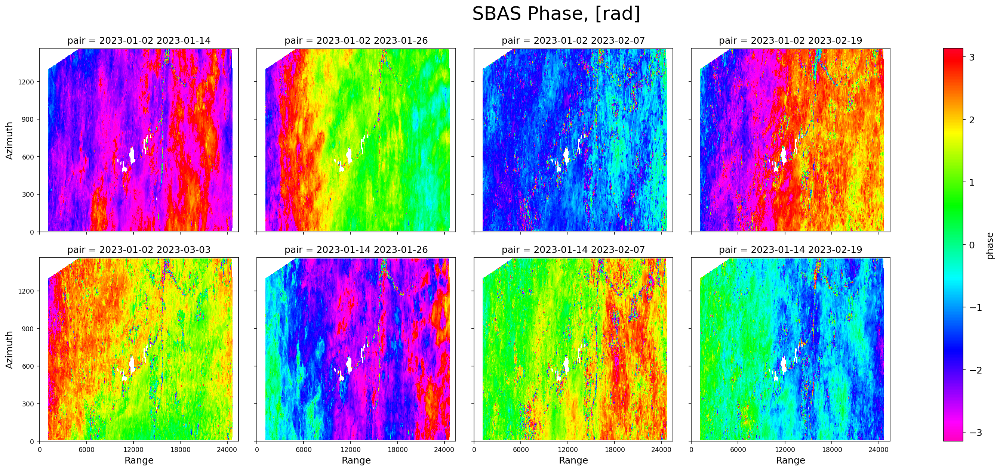

In [12]:
sbas.plot_interferograms(intf_sbas[:8], caption='SBAS Phase, [rad]')

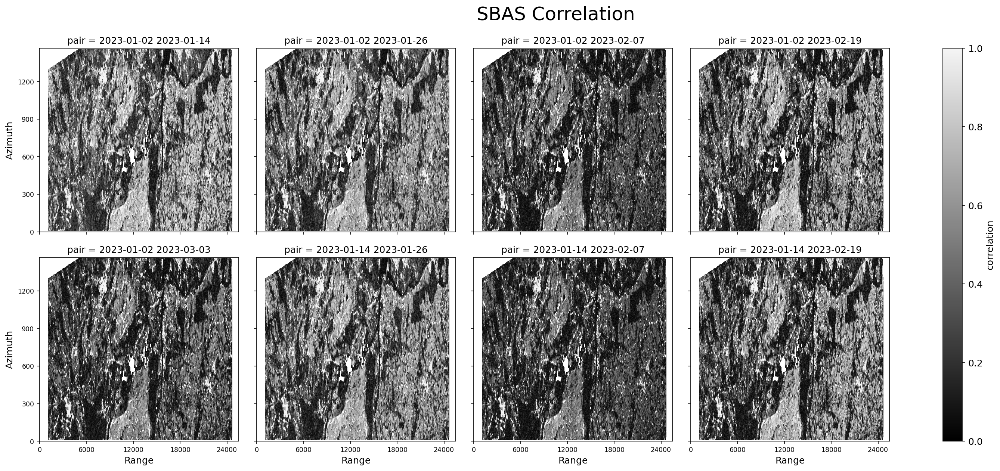

In [13]:
sbas.plot_correlations(corr_sbas[:8], caption='SBAS Correlation')

In [16]:
baseline_pairs = sbas.sbas_pairs(days=60)
#baseline_pairs['corr'] = corr_sbas.sel(pair=baseline_pairs.pair.values).mean(['y', 'x'])
baseline_pairs['corr'] = corr_sbas.mean(['y', 'x'])
print(len(baseline_pairs))
baseline_pairs

35


,ref,rep,ref_baseline,rep_baseline,pair,baseline,duration,rel,corr
0,2023-01-02,2023-01-14,-1.01,-116.90,2023-01-02 2023-01-14,-115.89,12,NaT,0.486208
1,2023-01-02,2023-01-26,-1.01,36.41,2023-01-02 2023-01-26,37.42,24,NaT,0.469867
2,2023-01-02,2023-02-07,-1.01,24.23,2023-01-02 2023-02-07,25.24,36,NaT,0.319555
3,2023-01-02,2023-02-19,-1.01,-0.00,2023-01-02 2023-02-19,1.01,48,NaT,0.414388
4,2023-01-02,2023-03-03,-1.01,28.97,2023-01-02 2023-03-03,29.98,60,NaT,0.338244
5,2023-01-14,2023-01-26,-116.90,36.41,2023-01-14 2023-01-26,153.31,12,NaT,0.440271
6,2023-01-14,2023-02-07,-116.90,24.23,2023-01-14 2023-02-07,141.13,24,NaT,0.293042
7,2023-01-14,2023-02-19,-116.90,-0.00,2023-01-14 2023-02-19,116.90,36,NaT,0.402328
8,2023-01-14,2023-03-03,-116.90,28.97,2023-01-14 2023-03-03,145.87,48,NaT,0.303296
9,2023-01-14,2023-03-15,-116.90,-213.89,2023-01-14 2023-03-15,-96.99,60,NaT,0.352072


In [17]:
pairs_best = sbas.sbas_pairs_covering_correlation(baseline_pairs, 2)
print (len(pairs_best))
pairs_best

14


,ref,rep,ref_baseline,rep_baseline,pair,baseline,duration,rel,corr
0,2023-01-02,2023-01-14,-1.01,-116.90,2023-01-02 2023-01-14,-115.89,12,NaT,0.486208
1,2023-01-02,2023-01-26,-1.01,36.41,2023-01-02 2023-01-26,37.42,24,NaT,0.469867
2,2023-01-02,2023-02-19,-1.01,-0.00,2023-01-02 2023-02-19,1.01,48,NaT,0.414388
3,2023-01-14,2023-01-26,-116.90,36.41,2023-01-14 2023-01-26,153.31,12,NaT,0.440271
4,2023-01-26,2023-02-19,36.41,-0.00,2023-01-26 2023-02-19,-36.41,24,NaT,0.440069
5,2023-02-19,2023-03-03,-0.00,28.97,2023-02-19 2023-03-03,28.97,12,NaT,0.420724
6,2023-02-19,2023-03-15,-0.00,-213.89,2023-02-19 2023-03-15,-213.89,24,NaT,0.469970
7,2023-02-19,2023-03-27,-0.00,-74.60,2023-02-19 2023-03-27,-74.60,36,NaT,0.347975
8,2023-03-03,2023-03-15,28.97,-213.89,2023-03-03 2023-03-15,-242.86,12,NaT,0.384351
9,2023-03-15,2023-03-27,-213.89,-74.60,2023-03-15 2023-03-27,139.29,12,NaT,0.386799


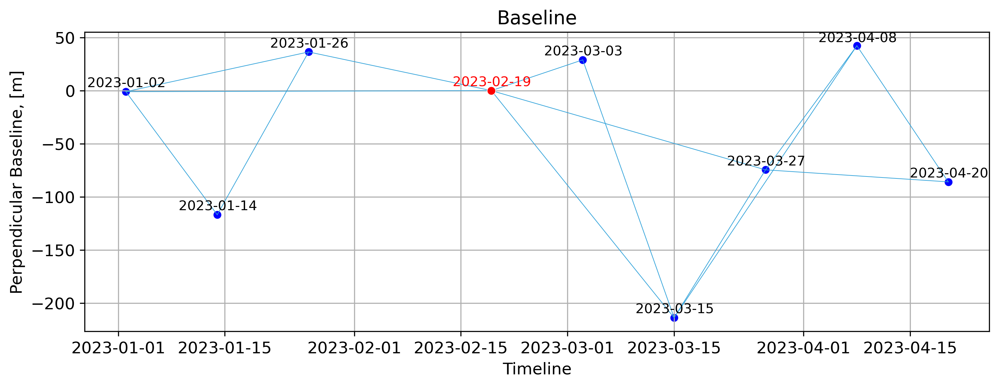

In [18]:
with mpl_settings({'figure.dpi': 300}):
    sbas.plot_baseline(pairs_best)

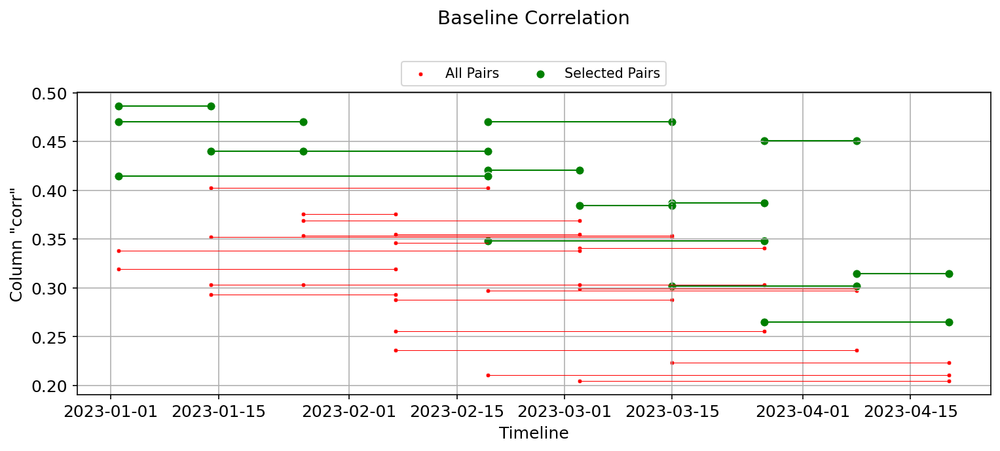

In [19]:
sbas.plot_baseline_correlation(baseline_pairs, pairs_best)

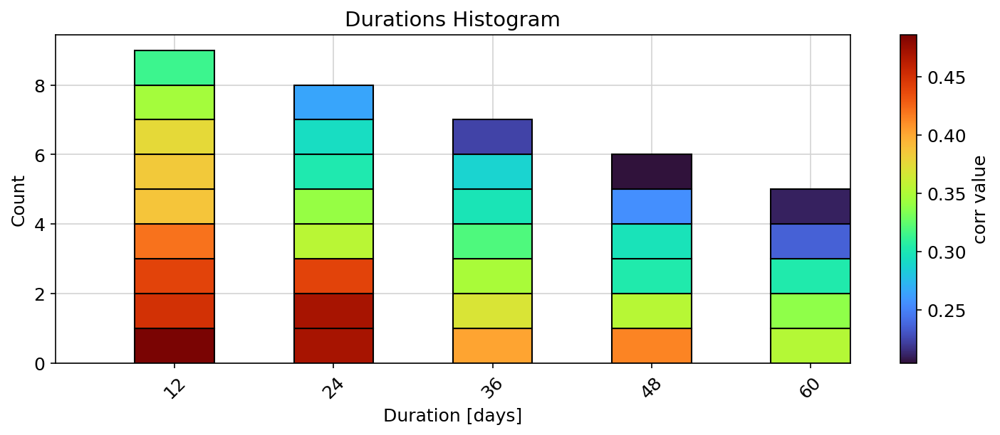

In [20]:
sbas.plot_baseline_duration(baseline_pairs, column='corr', ascending=False)

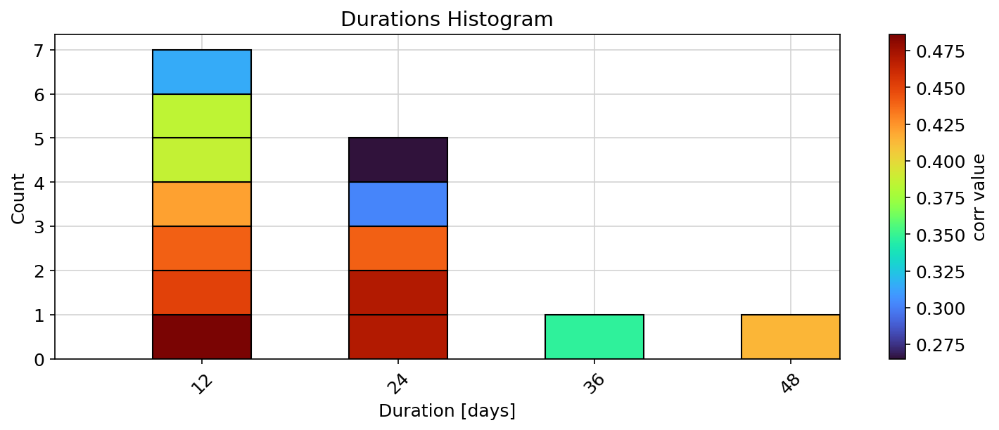

In [21]:
sbas.plot_baseline_duration(pairs_best, column='corr', ascending=False)

In [22]:
intf_sbas = intf_sbas.sel(pair=pairs_best.pair.values)
corr_sbas = corr_sbas.sel(pair=pairs_best.pair.values)

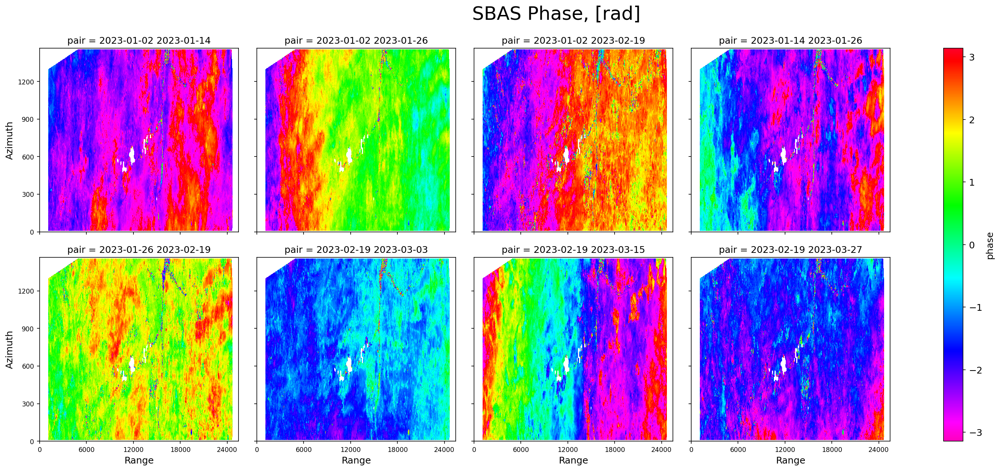

In [23]:
sbas.plot_interferograms(intf_sbas[:8], caption='SBAS Phase, [rad]')

In [24]:
corr_sbas_stack = corr_sbas.mean('pair')

In [25]:
corr_sbas_stack = sbas.sync_cube(corr_sbas_stack, 'corr_sbas_stack')

ValueError: No clients found
Start a client and point it to the scheduler address
  from distributed import Client
  client = Client('ip-addr-of-scheduler:8786')


In [ ]:
sbas.plot_correlation_stack(corr_sbas_stack, CORRLIMIT := 0.3, caption='SBAS Stack Correlation')